# Álgebra Lineal Aplicada para Machine Learning

En ML es importante pensar a las matrices como transformaciones lineales que al aplicarla cambia el espacio o el vector

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

In [2]:
def plotVector(vect, cols, alpha = 1, lim=(-.5, .5)):
    # plt.figure()
    
    for i in range(len(vect)):
        x = np.concatenate([[0, 0], vect[i]])
        
        plt.quiver(
            [x[0]],
            [x[1]],
            [x[2]],
            [x[3]],
            angles="xy", scale_units="xy", scale=1,
            color=cols[i],
            alpha=alpha
        )

    if lim is not None:
        plt.xlim(lim[0], lim[1])
        plt.ylim(lim[0], lim[1])
            
        plt.grid()

In [3]:
A = np.array([
    [-1, 3],
    [2, -2]
])

In [4]:
vector = np.array([[2],[1]])

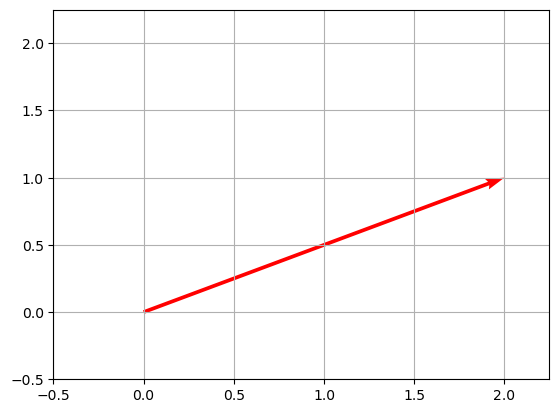

In [5]:
plotVector([vector.flatten()], ["r"], lim=(- .5, 2.25))

In [6]:
vectorTransformed = A.dot(vector)
vectorTransformed

array([[1],
       [2]])

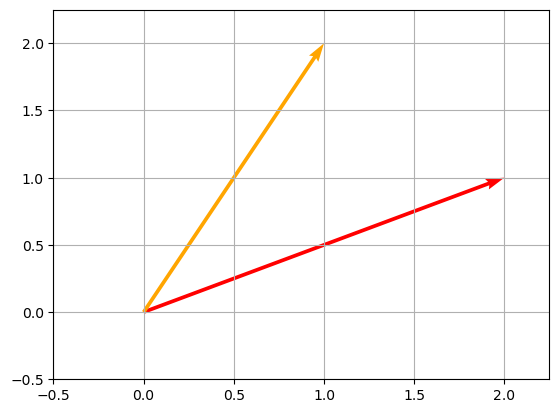

In [7]:
plotVector([vector.flatten(), vectorTransformed.flatten()], ["r", "orange"], lim=(- .5, 2.25))

In [8]:
print(np.linalg.norm(vector))
print(np.linalg.norm(vectorTransformed))

2.23606797749979
2.23606797749979


## Autovalores y Autovectores

Es aquel que al aplicar una matriz, regresa un vector de la misma dirección pero distinta amplitud.

$$A\cdot v = v\cdot k$$

- Para conseguir los autovalores y autoverctores de la matriz A, esta debe ser cuadrada.
- La matriz A tendrá tantos autovalores como dimensión tenga A.
- Los autovalores pueden repetirse
- Estos autovalores son los que forman los autovectores
- Los autovectores deben ser base, es decir, que desde esos autovectores se pueda generar todo el espacio o demás vectores

In [9]:
orange_light = "#FF9A13"
blue_light = "#1190FF"

In [10]:
X = np.array([
    [3, 2],
    [4, 1]
])
X

array([[3, 2],
       [4, 1]])

In [11]:
# Queremos hallar un vector que al aplicar la matriz siga siendo el mismo vector
v = np.array([[1],[1]])
v

array([[1],
       [1]])

In [12]:
u = X.dot(v)
u

array([[5],
       [5]])

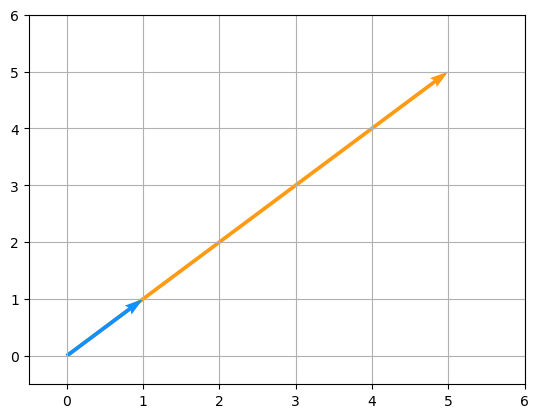

In [13]:
plotVector([u.flatten(), v.flatten()], [orange_light, blue_light], lim=(-.5, 6))

### ¿Cómo calcularlos?

In [14]:
X = np.array([
    [3, 2],
    [4, 1]
])
X

array([[3, 2],
       [4, 1]])

In [15]:
autovalores, autovectores = np.linalg.eig(X)

In [16]:
autovalores

array([ 5., -1.])

In [17]:
autovectores[:, 0] # Multiplos de todos los vectores que tienen la misma direccion

array([0.70710678, 0.70710678])

In [18]:
autovectores[:, 1]

array([-0.4472136 ,  0.89442719])

In [19]:
v = np.array([-1, 2])
Xv = X.dot(v)
v_np = autovectores[:, 1]

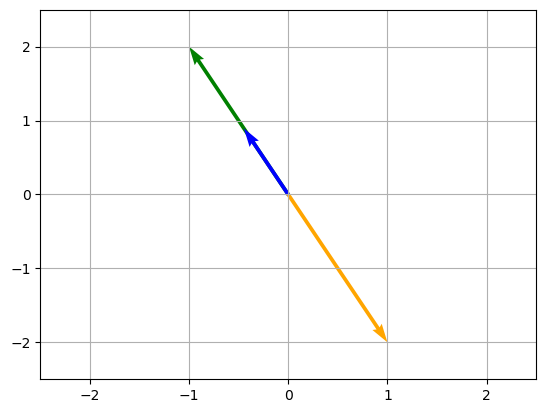

In [20]:
plotVector([v, Xv, v_np], ["green", "orange", "blue"], lim=(-2.5, 2.5))

## Descomponer matrices

Es encontrar dos o más matrices que me ayuden a escribir mi matriz original.

$$A=\begin{bmatrix}
\text{eig vectors}
\end{bmatrix} \cdot \begin{bmatrix}
\lambda_1 && \\
&& \lambda_2
\end{bmatrix} \cdot \begin{bmatrix}
\text{eig vectors}

\end{bmatrix}^{-1}$$

Donde los $\lambda$ son los auto valores

### Matrices cuadradas

In [21]:
A = np.array([
    [3, 2],
    [4, 1]
])
autovalores, autovectores = np.linalg.eig(A)

In [22]:
A

array([[3, 2],
       [4, 1]])

In [23]:
A_calc = autovectores.dot(np.diag(autovalores)).dot(np.linalg.inv(autovectores))
A_calc

array([[3., 2.],
       [4., 1.]])

#### Matriz simetrica 
$$A=A^T$$

In [24]:
A = np.array([
    [3, 2],
    [2, 3]
])
autovalores, autovectores = np.linalg.eig(A)

In [25]:
A_calc = A.T
A_calc

array([[3, 2],
       [2, 3]])

### Matriz no cuadrada (SVD)

Supongamos que U y V son ortogonales y una matriz diagonal D con los valores singulares. V son los vectores derechos singulares, mientras que en U los izquierdos

$$A=U\cdot D\cdot V$$

In [26]:
A = np.array([[1,2,3], [4,5,6]])
A

array([[1, 2, 3],
       [4, 5, 6]])

In [27]:
U, D, V = np.linalg.svd(A)

In [28]:
U

array([[-0.3863177 ,  0.92236578],
       [-0.92236578, -0.3863177 ]])

In [29]:
V

array([[-0.42866713, -0.56630692, -0.7039467 ],
       [-0.80596391, -0.11238241,  0.58119908],
       [ 0.40824829, -0.81649658,  0.40824829]])

In [30]:
np.diag(D)

array([[9.508032  , 0.        ],
       [0.        , 0.77286964]])

## Transformaciones principales

In [31]:
def plotMatrix(matrix, vectCol=["r", "b"], lim=(-1.5, 1.5)):
    #circulo unitario
    x=np.linspace(-1,1,1000000)
    y=np.sqrt(1-x**2)

    #circulo unitario transformado
    x1 = matrix[0,0]*x + matrix[0,1]*y
    y1 = matrix[1,0]*x + matrix[1,1]*y
    x1_neg = matrix[0,0]*x - matrix[0,1]*y
    y1_neg = matrix[1,0]*x - matrix[1,1]*y

    #vectores
    u1 = [matrix[0,0], matrix[1,0]]
    v1 = [matrix[0,1], matrix[1,1]]

    plotVector([u1,v1], cols=[vectCol[0],vectCol[1]], lim=lim)

    plt.plot(x1,y1, 'green', alpha =0.7)
    plt.plot(x1_neg,y1_neg, 'green', alpha =0.7)

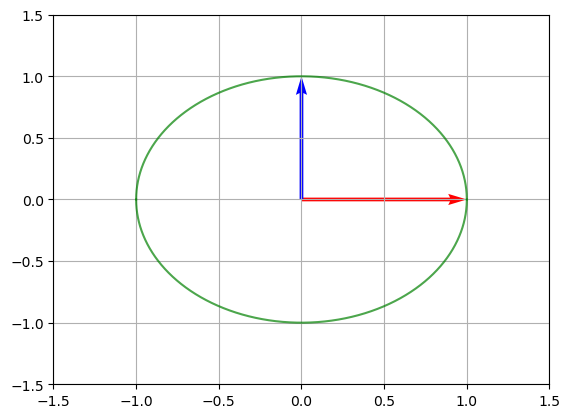

In [32]:
plotMatrix(np.eye(2))

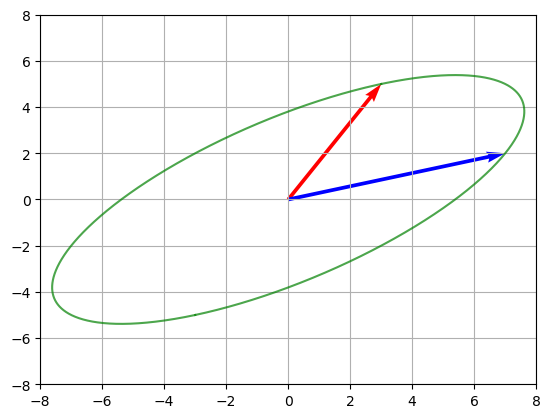

In [33]:
A= np.array([[3, 7], [5, 2]])
plotMatrix(A, lim=(-8, 8))

### Aplicación de las matrices D y V y U y su efecto en la transformación

- La matriz V rota el espacio
- La matriz D escala el espacio.
- La matriz U rota de nuevo el espacio.
- La transformación del espacio de una matriz A es igual a la transformación de las matrices SVD (Valores singulares)

In [34]:
U, D, V = np.linalg.svd(A)

Circulo unitario:


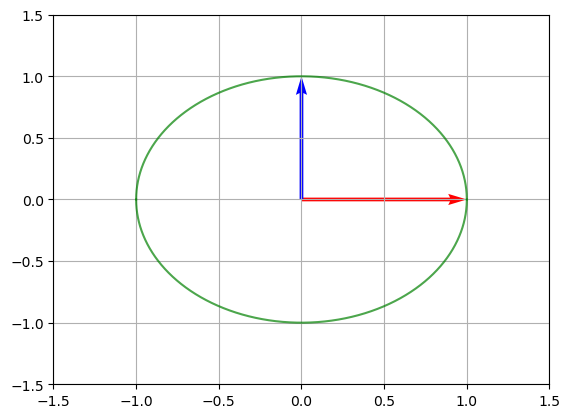

Primer rotación V:


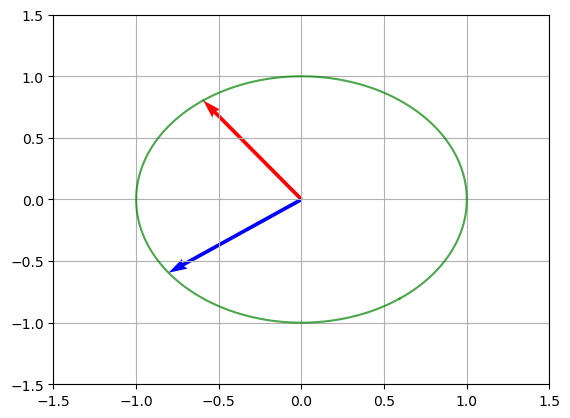

Escala D:


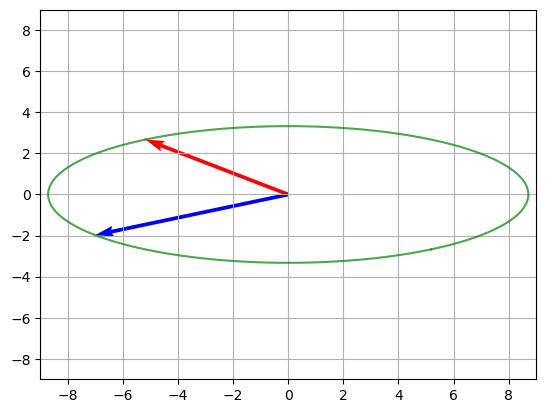

Segunda rotación U:


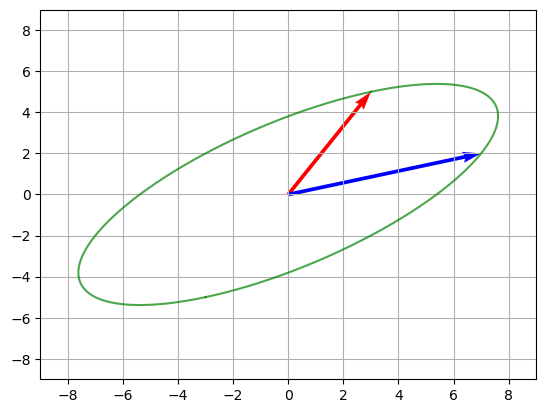

In [35]:
print("Circulo unitario:")
plotMatrix(np.eye(2))
plt.show()

print("Primer rotación V:")
plotMatrix(V)
plt.show()

print("Escala D:")
plotMatrix(np.diag(D).dot(V), lim=(-9,9))
plt.show()

print("Segunda rotación U:")
plotMatrix(U.dot(np.diag(D).dot(V)), lim=(-9,9))
plt.show()

### ¿Cómo interpretar valores singulares?

In [36]:
A = np.array([[3, 7], [5, 2]])
A

array([[3, 7],
       [5, 2]])

In [37]:
U, D, V = np.linalg.svd(A)

In [38]:
D

array([8.71337969, 3.32821489])

In [39]:
u1 = [D[0] * U[0, 0], D[0] * U[0, 1]]
v1 = [D[1] * U[1, 0], D[1] * U[1, 1]]

print(A[0, 0], A[1, 0])
print(u1)
print()
print(A[0, 1], A[1,1])
print(v1)


3 5
[-7.4120434792975685, -4.580894796297923]

7 2
[-1.7497461132982814, 2.8311486829996433]


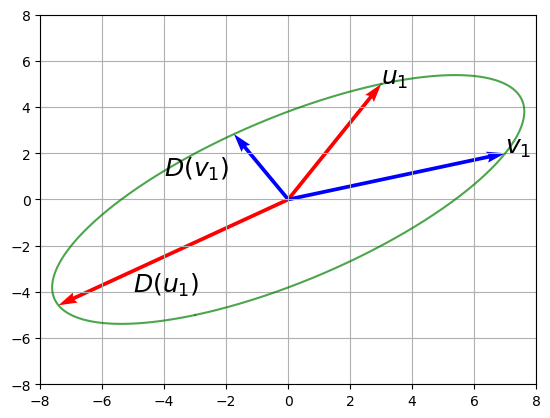

In [40]:
plotMatrix(A, lim=(-8, 8))
plotVector([u1, v1], ["red", "blue"], lim=None)

plt.text(3, 5, r"$u_1$", size=18)
plt.text(7, 2, r"$v_1$", size=18)

plt.text(-5, -4, r"$D(u_1)$", size=18)
plt.text(-4, 1, r"$D(v_1)$", size=18)

plt.show()

## Imagen de una matriz

In [41]:
from PIL import Image

In [42]:
import requests

url = "https://static.platzi.com/media/tmp/class-files/git/algebra-aplicada/algebra-aplicada-master/02%20-%20Aplicacion%20de%20SVD%20a%20una%20imagen/imagenes/imagen_ejemplo_frida_bredesen.jpg"

response = requests.get(url)
path = "./data/imagen_ejemplo_frida_bredesen.jpg"

# Escribe el contenido de la respuesta en un archivo
with open(path, "wb") as f:
    f.write(response.content)


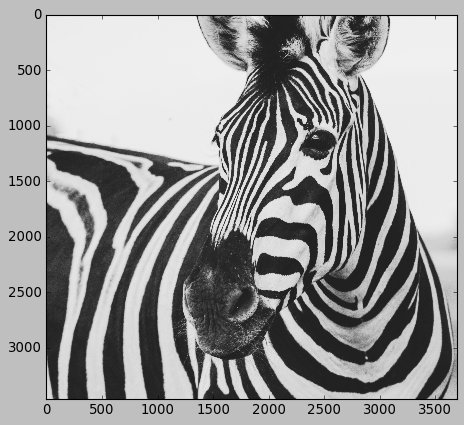

In [43]:
plt.style.use("classic")

img = Image.open(path)

plt.imshow(img)
plt.show()

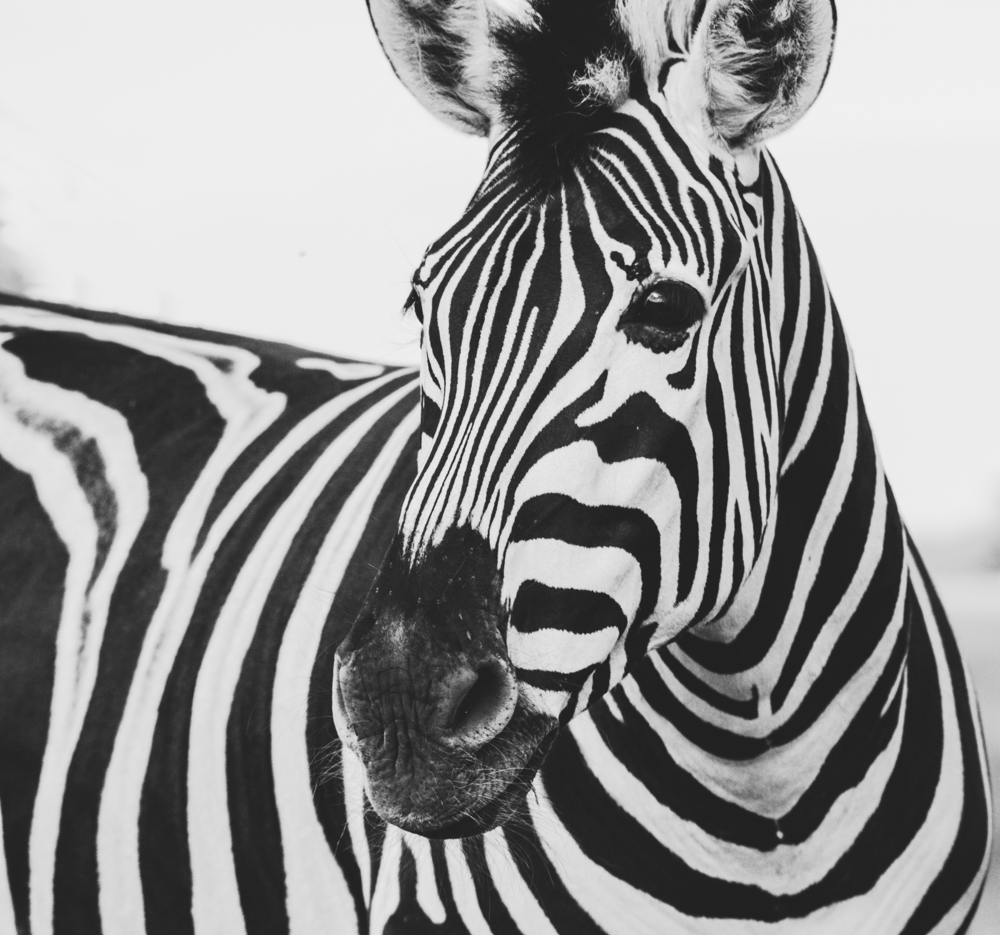

In [44]:
img_gr = img.convert("L")
img_gr

In [45]:
img_matrix = np.array(list(img_gr.getdata(0)), float)
img_matrix

array([237., 236., 236., ..., 194., 193., 192.])

In [46]:
img_matrix.shape = (img_gr.size[1], img_gr.size[0])
img_matrix

array([[237., 236., 236., ..., 239., 239., 239.],
       [237., 236., 236., ..., 239., 239., 239.],
       [237., 236., 236., ..., 238., 238., 238.],
       ...,
       [216., 216., 216., ..., 197., 197., 195.],
       [216., 216., 215., ..., 195., 195., 193.],
       [216., 216., 215., ..., 194., 193., 192.]])

In [47]:
img_matrix.shape

(3456, 3693)

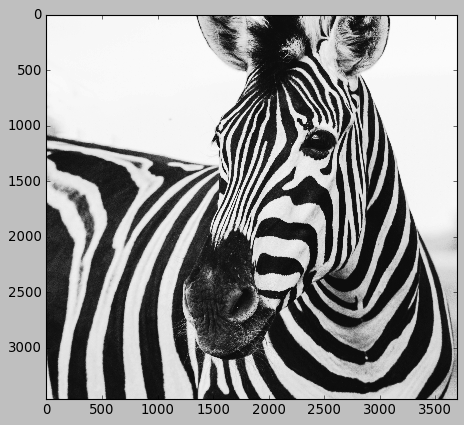

In [48]:
plt.imshow(img_matrix, cmap="gray")

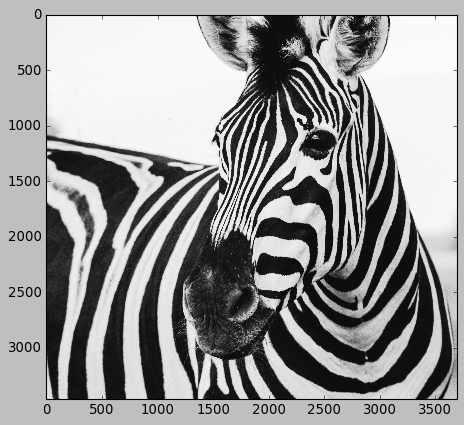

In [49]:
plt.imshow(img_matrix / 10, cmap="gray")

### SVD a imagenes

In [50]:
U, D, V = np.linalg.svd(img_matrix)

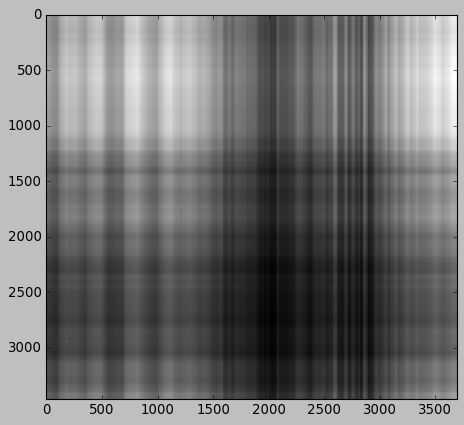

In [51]:
img_reconst = np.matrix(U[:, :1]) * np.diag(D[:1]) * np.matrix(V[:1, :])
plt.imshow(img_reconst, cmap="gray")
plt.show()

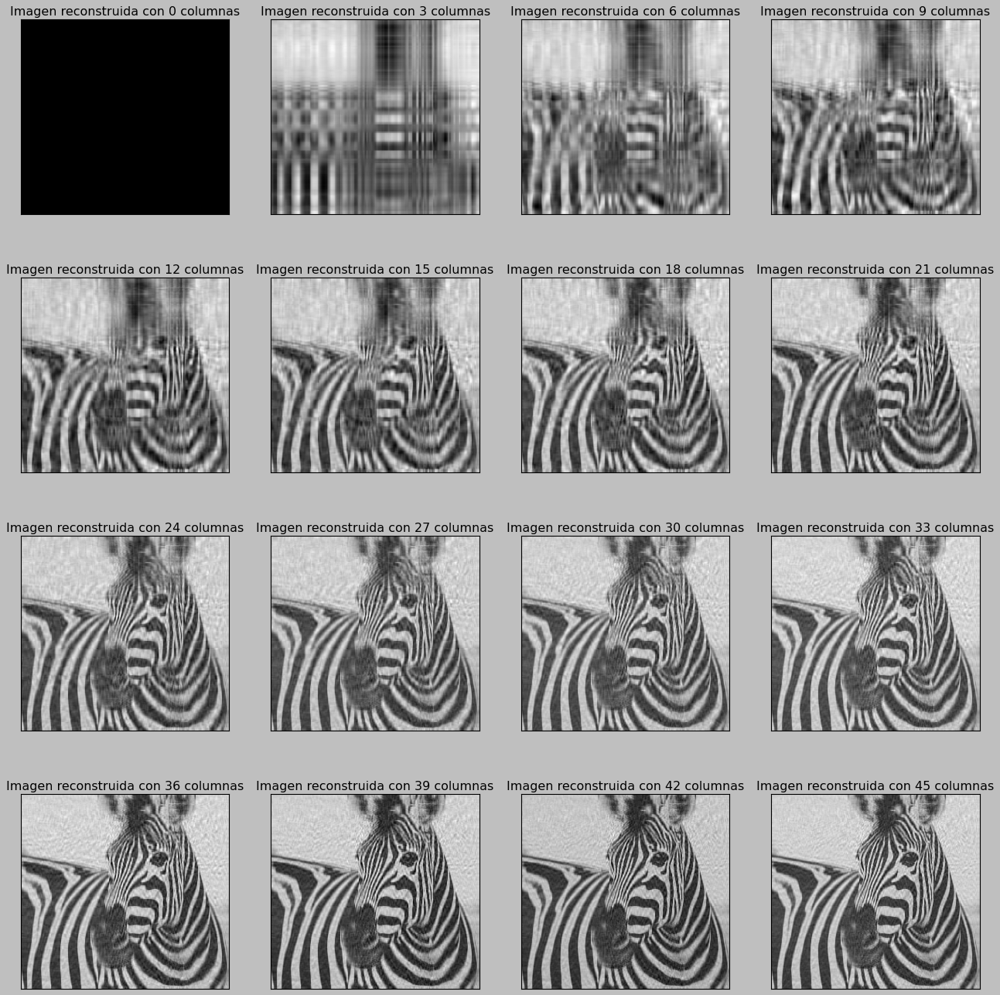

In [52]:
fig, ax = plt.subplots(4, 4, figsize=(20,20))
c = 0
for i in ax:
    for j in i:
        img_reconst = np.matrix(U[:, :c*3]) * np.diag(D[:c*3]) * np.matrix(V[:c*3, :])
        j.imshow(img_reconst, cmap="gray")
        j.set_title(f"Imagen reconstruida con {c*3} columnas")
        j.set_xticks([])
        j.set_yticks([])
        c += 1
        
plt.xticks([])
plt.yticks([])
plt.show()

## Psudoinversa de Moore Penrose

Recordemos que la inversa no siempre existe, ya que existen matrices singulares. Pero se puede hallar la pseudo inversa: $$A\cdot A_{pse}\simeq I$$

$$A_{pse}=V\cdot D_{pse} \cdot U^T$$

In [53]:
np.set_printoptions(suppress=True) # no mostrar los numeros cercanos a 0 y verlos en 0

In [5]:
A = np.array([[1, 4], [2, 5], [3, 6]])
U, D, V = np.linalg.svd(A)

In [6]:
D_pse = np.zeros(A.shape).T
D_pse

array([[0., 0., 0.],
       [0., 0., 0.]])

In [7]:
# Reemplazar los valores de D_pse
D_pse[: D.shape[0], : D.shape[0]] = np.linalg.inv(np.diag(D))
D_pse

array([[0.10517424, 0.        , 0.        ],
       [0.        , 1.29387927, 0.        ]])

In [8]:
A_pse = V.T.dot(D_pse).dot(U.T)
A_pse

array([[-0.94444444, -0.11111111,  0.72222222],
       [ 0.44444444,  0.11111111, -0.22222222]])

In [9]:
A_pse_calc = np.linalg.pinv(A)
A_pse_calc

array([[-0.94444444, -0.11111111,  0.72222222],
       [ 0.44444444,  0.11111111, -0.22222222]])

In [10]:
A_pse_calc.dot(A)

array([[ 1.00000000e+00, -2.22044605e-16],
       [ 3.05311332e-16,  1.00000000e+00]])

In [11]:
np.set_printoptions(suppress=False)

In [12]:
A_pse_calc.dot(A) # Recordemos que no es exactamente la inversa

array([[ 1.00000000e+00, -2.22044605e-16],
       [ 3.05311332e-16,  1.00000000e+00]])

In [13]:
A.dot(A_pse_calc) # No son conmutativas

array([[ 0.83333333,  0.33333333, -0.16666667],
       [ 0.33333333,  0.33333333,  0.33333333],
       [-0.16666667,  0.33333333,  0.83333333]])

In [14]:
a_pse_2 = np.linalg.inv(A.T.dot(A)).dot(A.T)
a_pse_2

array([[-0.94444444, -0.11111111,  0.72222222],
       [ 0.44444444,  0.11111111, -0.22222222]])

### Usandola para resolver un sistema sobbredeterminando

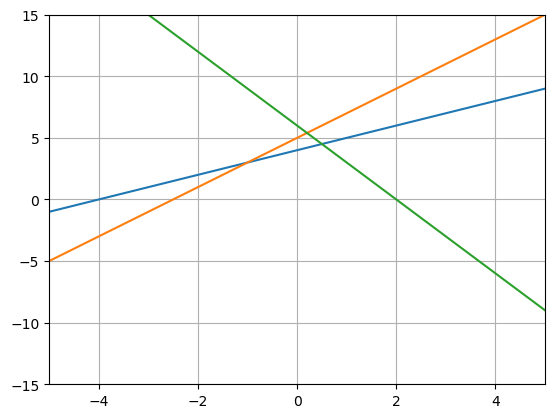

In [4]:
x = np.linspace(-5, 5, 1000)

y_1 = 1 * x + 4
y_2 = 2 * x + 5
y_3= -3 * x + 6

plt.plot(x, y_1)
plt.plot(x, y_2)
plt.plot(x, y_3)

plt.ylim(-15, 15)
plt.xlim(-5, 5)

plt.grid()

In [21]:
matrix = np.array([
    [1, 4],
    [1, 5],
    [1, 6]
])
matrix_pse = np.linalg.pinv(matrix)
matrix_pse

array([[ 2.83333333e+00,  3.33333333e-01, -2.16666667e+00],
       [-5.00000000e-01,  1.16239559e-16,  5.00000000e-01]])

In [22]:
b = np.array([[1], [2], [-3]])

solve = matrix_pse.dot(b)
solve

array([[10.],
       [-2.]])

In [24]:
np.array([[1, 2, 3, 4], [5, 6, 7, 8], [9,10, 11,12]]).T

array([[ 1,  5,  9],
       [ 2,  6, 10],
       [ 3,  7, 11],
       [ 4,  8, 12]])

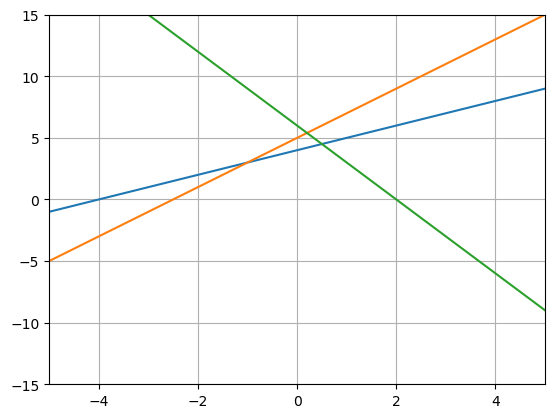

In [23]:
plt.plot(x, y_1)
plt.plot(x, y_2)
plt.plot(x, y_3)

plt.scatter(solve[0], solve[1])

plt.ylim(-15, 15)
plt.xlim(-5, 5)

plt.grid()

## PCA

PCA es una técnica del análisis multivariado (estadística muy avanzada) que combina conceptos de álgebra lineal y estadistica y la finalidad de este método es REDUCIR, ojo!, no eliminar sino reducir la misma información de todas nuestras variables (dimensiones) a unas nuevas variables que les vamos a llamar componentes principales, y estas variables van a:

1. Explicar la misma información que las variables más fuertes o con más variabilidad 
2. Contener adicionalmente la mayor información posible de las otras dimensiones que no arrojen tanta información o no haya tanta correlación

![](https://static.platzi.com/media/user_upload/0351bfe3610a3ba89bea599ee9d054ae-1469e454-3c82-4511-adfb-b8c97975f721.jpg)

Observemos que en la imagen estamos en R3 es decir tenemos 3 dimensiones pero observamos que realmente la correlación y la mayor informacion se concentran mas en dos ciertas regiones donde se pueden obtener eigenvectores que describan la direccion de estos datos, PERFECTO esto va a ser nuestro nuevo eje un eje en R2 donde la información de la info de nuestra 3er dimension ahora se junto con las otras dos dimensiones para no estar en un plano R3 sino R2.

¿Se conserva el 100% de nuestra misma información original? NO, pero es útil si supongamos que realizamos una experimentación muy costosa en la que la tercera acción para nuestra encuesta no es muy relevante, un PCA antes de nos ayuda a ver cuales son LOS COMPONENTES PRINCIPALES por los que vale la pena enfocarnos.

La maldición de la dimensión: Esto dice que por cada variable que agrego en el conjunto de datos vamos a necesitar exponencialmente más muestras para poder tener la misma relevancia estadística.

In [85]:
np.random.seed(42)

N = 200

x = 3 * np.random.rand(N)

y = 20 * x + 2 * np.random.rand(N)

x = x.reshape(200, 1)
y = y.reshape(200, 1)

In [88]:
xy = np.hstack([x, y])
xy.shape

(200, 2)

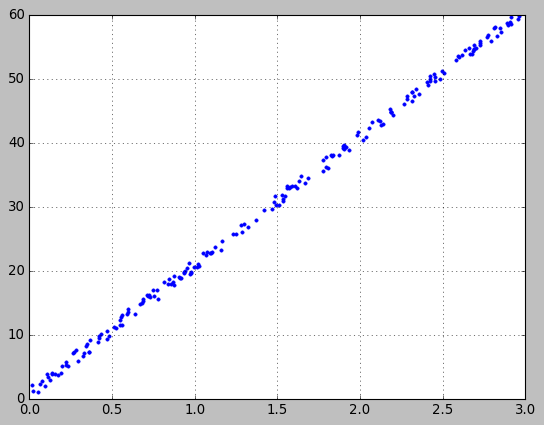

In [92]:
plt.plot(xy[:, 0] , xy[:, 1], ".")

plt.grid()

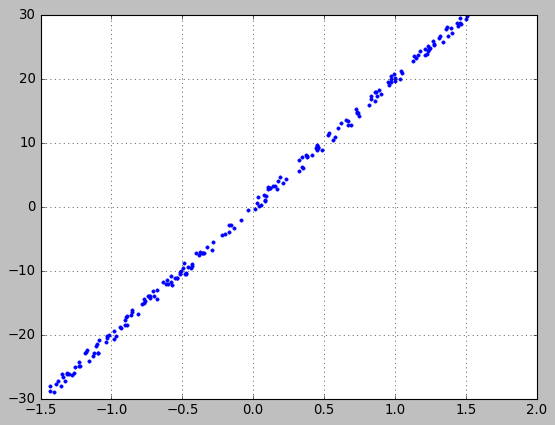

In [109]:
xy_center = xy - np.mean(xy, axis = 0)

plt.plot(xy_center[:, 0] , xy_center[:, 1], ".")

plt.grid()

In [110]:
autovalues, autovectors = np.linalg.eig(xy_center.T.dot(xy_center))
autovalues, autovectors

(array([1.70408413e-01, 6.24117888e+04]),
 array([[-0.99875285, -0.04992746],
        [ 0.04992746, -0.99875285]]))

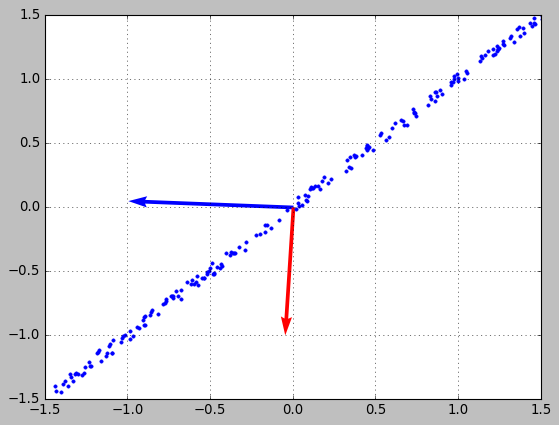

In [111]:
plotVector(autovectors.T, ["b", "r"], lim=(-1.5, 1.5))
plt.plot(xy_center[:, 0] , xy_center[:, 1]/20, ".")


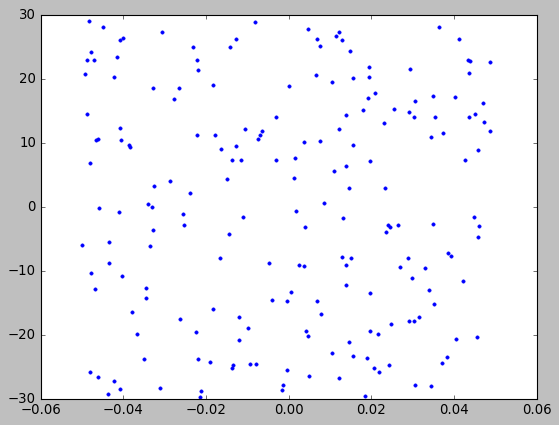

In [115]:
xy_nuevo = autovectors.T.dot(xy_center.T)

#Podemos ver acá que la nube de datos cambió y podemos ver que
# el eje y captura la mayor varianza, o sea la mayor información
# de los datos. Lo que calza con la elección de nuestro autovector.

plt.plot(xy_nuevo[0, :], xy_nuevo[1, :], '.')
plt.show()

### Preparando conjunto de imagenes para aplicar PCA

In [118]:
import imageio
import pandas as pd
import sklearn.datasets

In [135]:
data = sklearn.datasets.fetch_olivetti_faces()
data

{'data': array([[0.30991736, 0.3677686 , 0.41735536, ..., 0.15289256, 0.16115703,
         0.1570248 ],
        [0.45454547, 0.47107437, 0.5123967 , ..., 0.15289256, 0.15289256,
         0.15289256],
        [0.3181818 , 0.40082645, 0.49173555, ..., 0.14049587, 0.14876033,
         0.15289256],
        ...,
        [0.5       , 0.53305787, 0.607438  , ..., 0.17768595, 0.14876033,
         0.19008264],
        [0.21487603, 0.21900827, 0.21900827, ..., 0.57438016, 0.59090906,
         0.60330576],
        [0.5165289 , 0.46280992, 0.28099173, ..., 0.35950413, 0.3553719 ,
         0.38429752]], dtype=float32),
 'images': array([[[0.30991736, 0.3677686 , 0.41735536, ..., 0.37190083,
          0.3305785 , 0.30578512],
         [0.3429752 , 0.40495867, 0.43801653, ..., 0.37190083,
          0.338843  , 0.3140496 ],
         [0.3429752 , 0.41735536, 0.45041323, ..., 0.38016528,
          0.338843  , 0.29752067],
         ...,
         [0.21487603, 0.20661157, 0.2231405 , ..., 0.15289256,
     

In [139]:
64**2

4096

In [152]:
images = data.data.reshape(400, 64, 64) / 255 # Normalizar datos

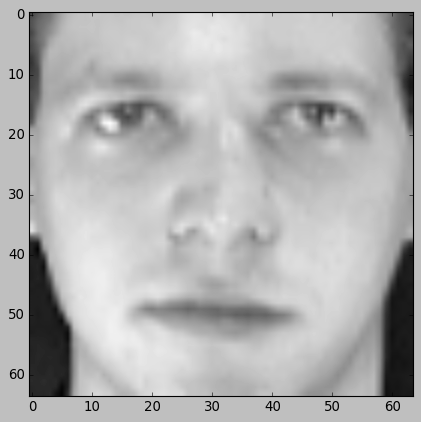

In [155]:
plt.imshow(images[0], cmap="gray")

In [176]:
caras = pd.DataFrame({"":[]})

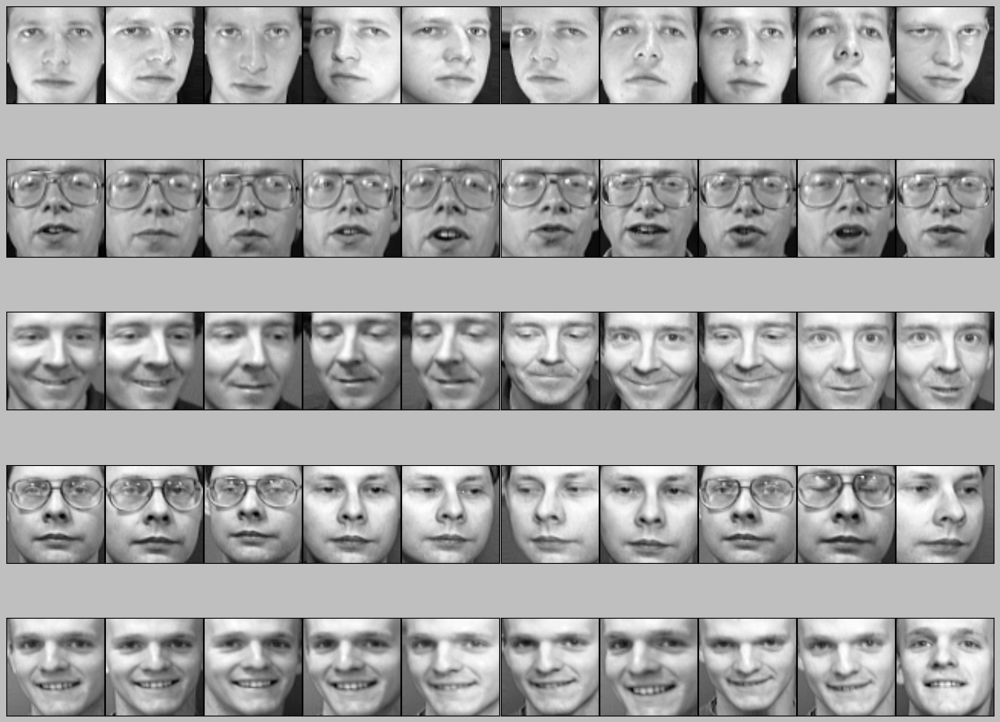

In [214]:
caras = pd.DataFrame([])

fig, ax = plt.subplots(5, 10, figsize=(20, 15),
                       subplot_kw={"xticks":[], "yticks":[]},
                       gridspec_kw={"hspace": 0.01, "wspace": 0.01})
c = 0
for i in ax:
    for j in i:
        
        # caras.loc[len(caras)] = images[c].flatten()
        # caras = pd.concat([caras, pd.Series(images[c].flatten())])
        caras[f"{c}"] = pd.Series(images[c].flatten())
        j.imshow(images[c], cmap="gray")
        c += 1

### Aplicando PCA

In [166]:
from sklearn.decomposition import PCA

In [219]:
pca = PCA(n_components=0.5) # 50% de la variación

pca.fit(caras)

PCA(n_components=0.5)

In [220]:
pca.n_components_

2

In [221]:
pca.components_[0]

array([-0.1375511 , -0.14000863, -0.15539727, -0.10279975, -0.19794334,
       -0.10103446, -0.09600501, -0.17572246, -0.10121687, -0.19298334,
       -0.09778851, -0.07594541, -0.10623693, -0.09543333, -0.04457673,
       -0.09496994, -0.14113756, -0.13177294, -0.09143566, -0.13333021,
       -0.18083072, -0.15881564, -0.15657176, -0.14382873, -0.13322534,
       -0.19037092, -0.18625337, -0.16816846, -0.19223844, -0.18647417,
       -0.14870466, -0.14583114, -0.13131446, -0.17006545, -0.17546193,
       -0.13610573, -0.14504921, -0.135338  , -0.10984132, -0.13414814,
       -0.14199792, -0.14513409, -0.1423001 , -0.1349085 , -0.12411683,
       -0.13113834, -0.12121341, -0.13142742, -0.13580018, -0.12986296],
      dtype=float32)

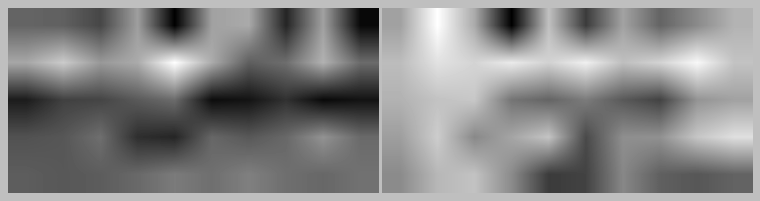

In [222]:
rows = 1
cols =  pca.n_components_ // rows

fig, ax = plt.subplots(rows, cols, figsize=(12, 6),
                       subplot_kw={"xticks":[], "yticks":[]},
                       gridspec_kw={"hspace": 0.01, "wspace": 0.01})

c = 0
for i in ax:
    i.imshow(pca.components_[c].reshape(5, 10), cmap="gray")
    i.axis("off")
    c += 1

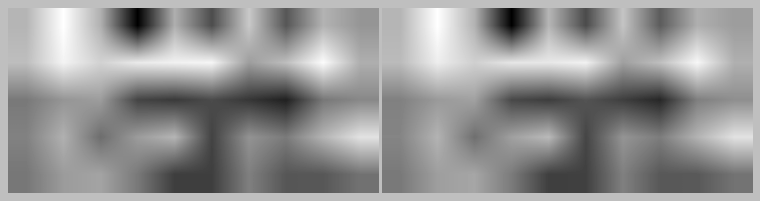

In [223]:
components = pca.transform(caras)
proyection = pca.inverse_transform(components)

fig, ax = plt.subplots(rows, cols, figsize=(12, 6),
                       subplot_kw={"xticks":[], "yticks":[]},
                       gridspec_kw={"hspace": 0.01, "wspace": 0.01})

c = 0
for i in ax:
    i.imshow(proyection[c].reshape(5, 10), cmap="gray")
    i.axis("off")
    c += 1